In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import pickle
from collections import defaultdict
from sklearn.manifold import TSNE

## how does the sampled data point look like? which are sampled, unlabeled, labeled?

In [28]:
def read_embedding_results(cylce):
    features = np.load(f'{base_path}/{folder}_{cycle}_features.npy')
    features_label = np.load(f'{base_path}/{folder}_{cycle}_features_label.npy')
    labeled_indices = np.load(f'{base_path}/{folder}_{cycle}_labeled_indices.npy')

    return [features, features_label, labeled_indices]

dataset = 'SnapshotSerengetiSmall'
method = 'mobyv2al'
run_id = 20240722
base_path = f'/Volumes/data01/waitsun/result_data_analysis/{dataset}_{method}_{run_id}'
folder = f'{dataset}_{method}_{run_id}'
features, features_label, labeled_indices = [],[],[]

for cycle in range(10):
    results = read_embedding_results(cycle)
    features.append(results[0])
    features_label.append(results[1])
    labeled_indices.append(results[2])





In [36]:
for i in range(10):
    print(labeled_indices[i].shape)
    print(features[i].shape)
    print(features_label[i].shape)
    print("")
    

(62343,)
(254484, 512)
(254484,)

(159341,)
(256984, 512)
(256984,)

(293146,)
(259484, 512)
(259484,)

(406214,)
(234220, 512)
(234220,)

(425976,)
(124912, 512)
(124912,)

(436957,)
(108026, 512)
(108026,)

(442973,)
(99782, 512)
(99782,)

(450350,)
(96376, 512)
(96376,)

(456897,)
(91661, 512)
(91661,)

(466468,)
(87763, 512)
(87763,)



In [3]:
tsne_embeddings = []
for i in range(10):
    tsne = TSNE(n_components=2, random_state=1234,n_jobs=-1)
    tmp = tsne.fit_transform(features[i])
    tsne_embeddings.append(tmp)

/Users/waitsun/miniforge3/envs/al-project/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/waitsun/miniforge3/envs/al-project/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/waitsun/miniforge3/envs/al-project/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/waitsun/miniforge3/envs/al-project/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/waitsun/miniforge3/envs/al-project/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE w

In [4]:
import pickle

with open('tsne_embeddings_corelbpseudo.pkl', 'wb') as file:
    pickle.dump(tsne_embeddings, file)


In [17]:
import random
NUM_TRAIN = 512522
indices = list(range(NUM_TRAIN))
random.seed(1234)
random.shuffle(indices)

In [7]:
sampled_indices = []
sampled_indices_position = []
for i in range(0,10,1):
    if i <=0:
        tmp = [(li, index) for  index,li in enumerate(labeled_indices[i]) if li not in indices[:5000]]
        tmp,pos = zip(*tmp)
    else:    
        tmp = [(li,index) for  index,li in enumerate(labeled_indices[i]) if li not in labeled_indices[i-1]]
        tmp,pos = zip(*tmp)
    sampled_indices.append(tmp)
    sampled_indices_position.append(pos)



In [40]:
print(len(sampled_indices[0]))
print(labeled_indices[0].shape)
63238 - 62343

63238
(62343,)


895

In [33]:
for i in range(10):
    print(features_label[i].shape)
    print(len(sampled_indices[i]))

(254484,)
63238
(256984,)
161218
(259484,)
190559
(234220,)
32865
(124912,)
17093
(108026,)
3833
(99782,)
3628
(96376,)
4626
(91661,)
3089
(87763,)
3097


In [18]:
sampled_labels = []
for i in range(10):
    tmp = [features_label[i][index] for index in sampled_indices_position[i]]
    sampled_labels.append(tmp)

    

IndexError: index 259484 is out of bounds for axis 0 with size 259484

IndexError: list index out of range

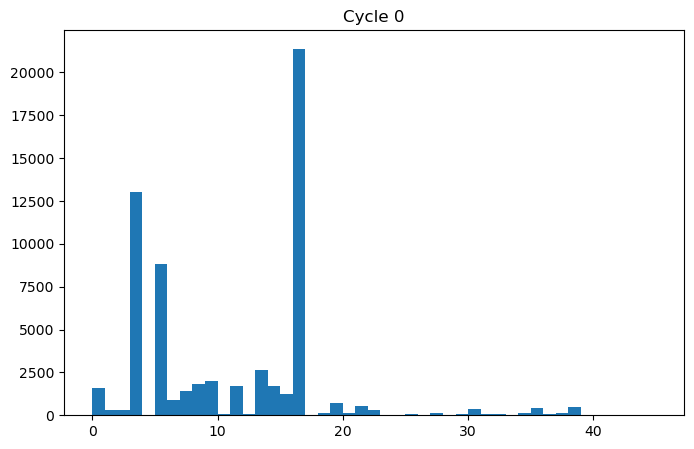

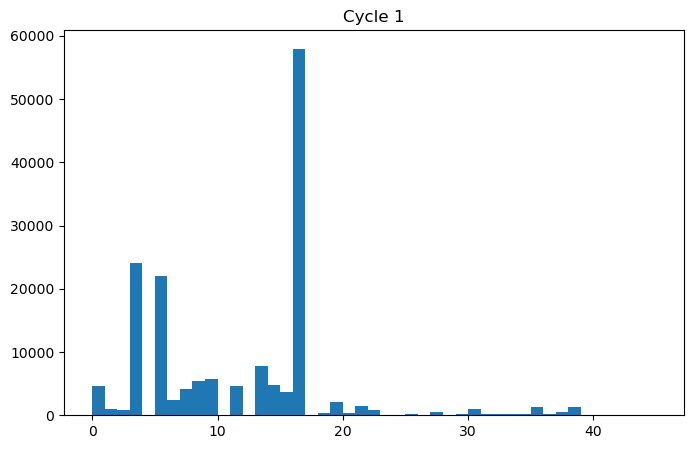

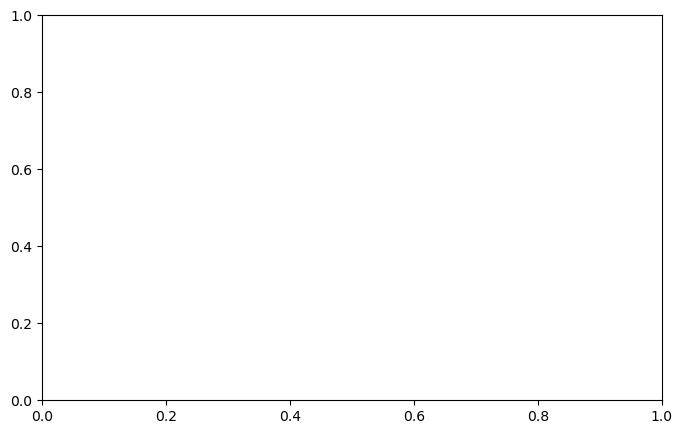

In [26]:
for i in range(10):
    fig, ax = plt.subplots(figsize=(8,5))
    ax.hist(sampled_labels[i],bins=np.arange(0,46,1))
    ax.set_title(f'Cycle {i}')

In [ ]:
lut = pd.read_pickle('/Volumes/data01/waitsun/snapshotSerengetiCropedResized/df_category_lut_adapted.df')

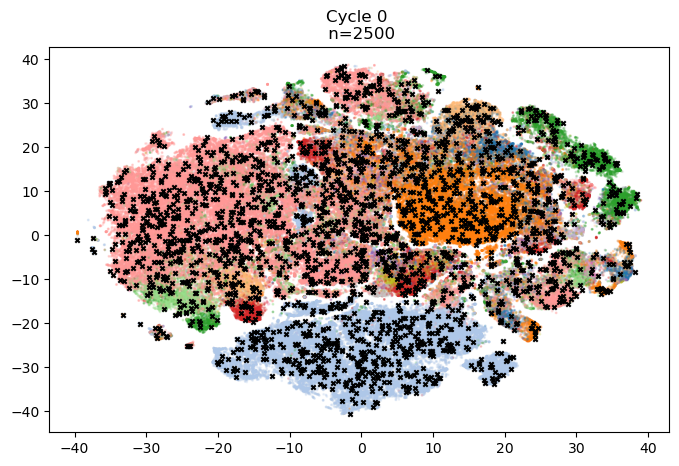

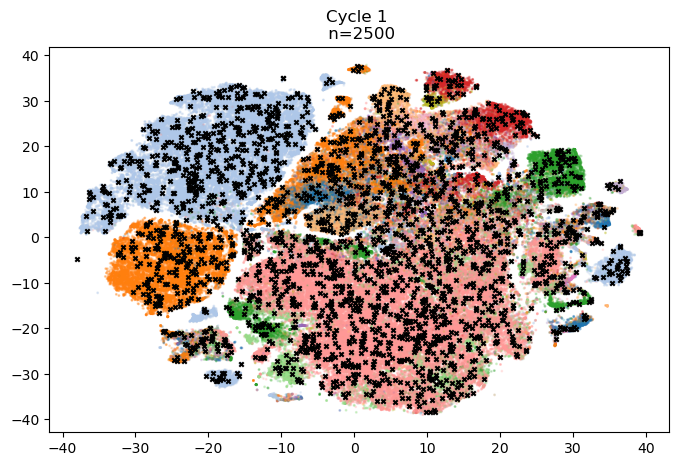

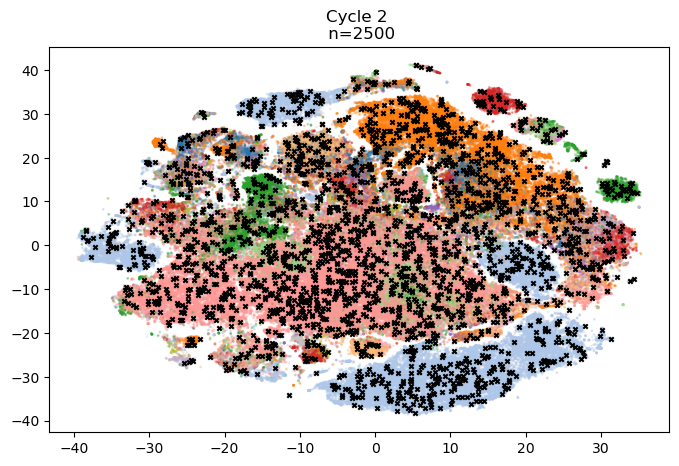

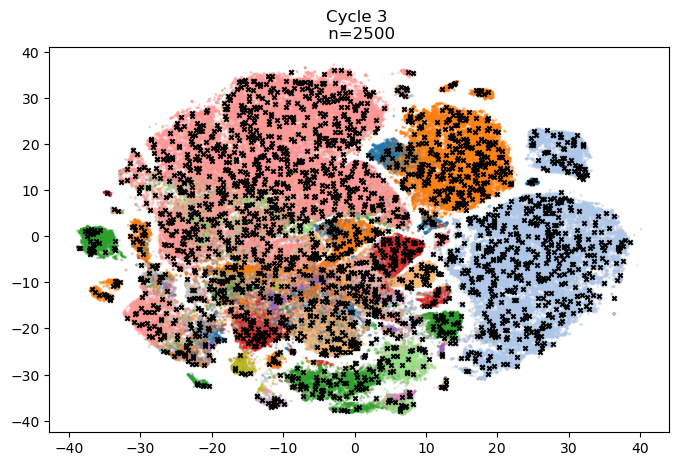

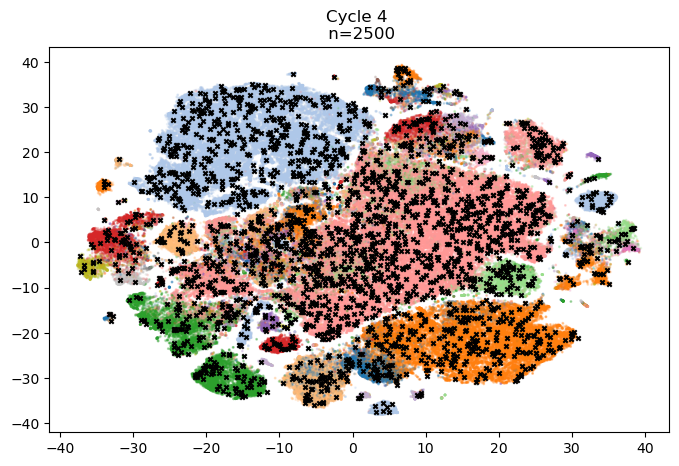

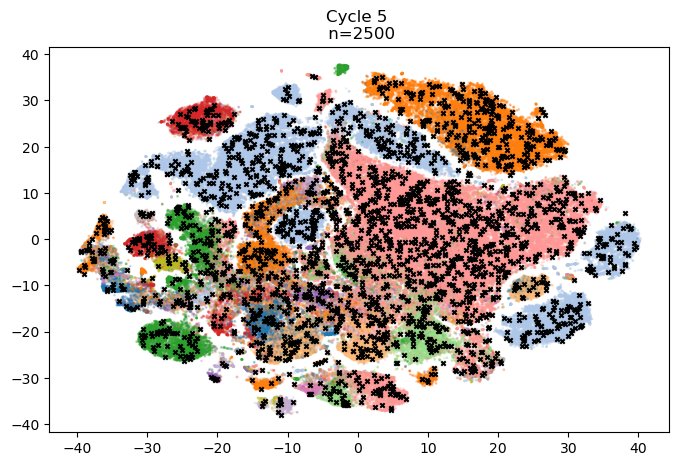

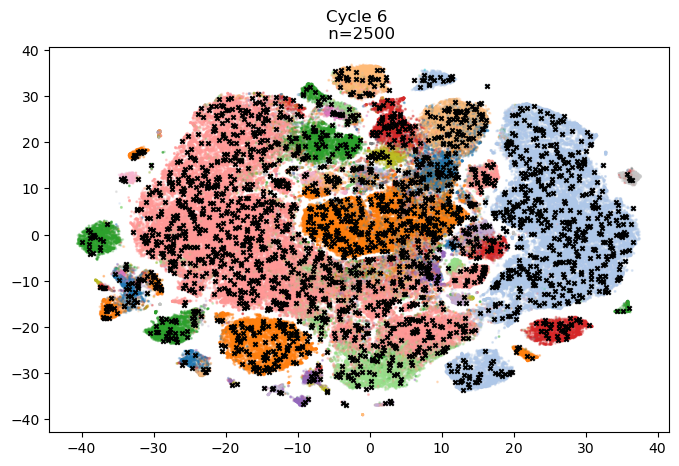

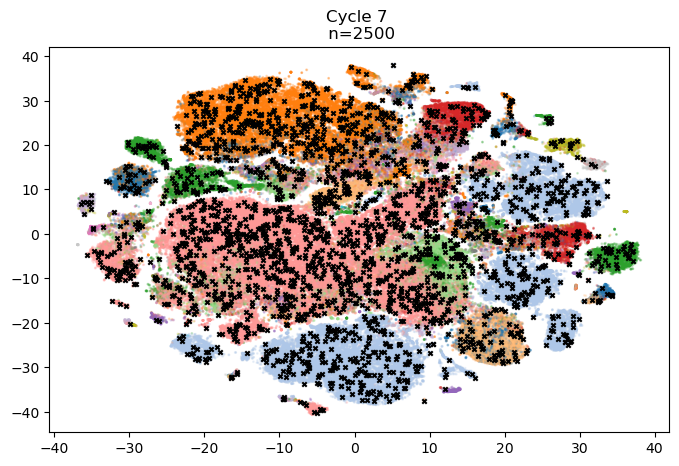

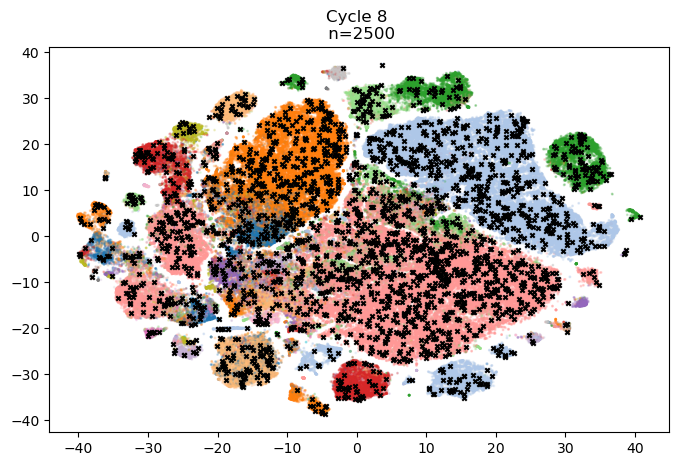

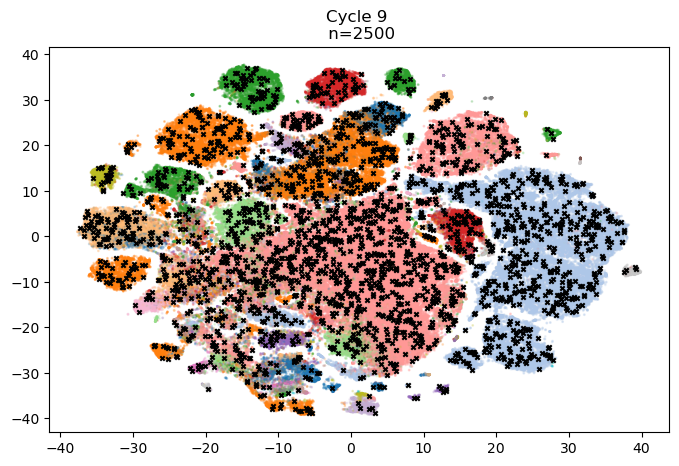

In [ ]:
for i in range(10):
    fig, ax = plt.subplots(figsize=(8,5))
    ax.scatter(tsne_embeddings[i][:,0],tsne_embeddings[i][:,1],c=features_label[i],s=1,cmap='tab20',alpha=0.2)
    ax.scatter(tsne_embeddings[i][sampled_indices_position[i],0],tsne_embeddings[i][sampled_indices_position[i],1],c='black',s=10,marker='x')
    ax.set_title(f'Cycle {i} \n n={len(tsne_embeddings[i][sampled_indices_position[i],0])}')
               

/var/folders/5f/83w09gxd6pq0h169x9168wcw0000gn/T/ipykernel_71677/390308480.py:15: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])
/var/folders/5f/83w09gxd6pq0h169x9168wcw0000gn/T/ipykernel_71677/390308480.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 10),dpi=300)


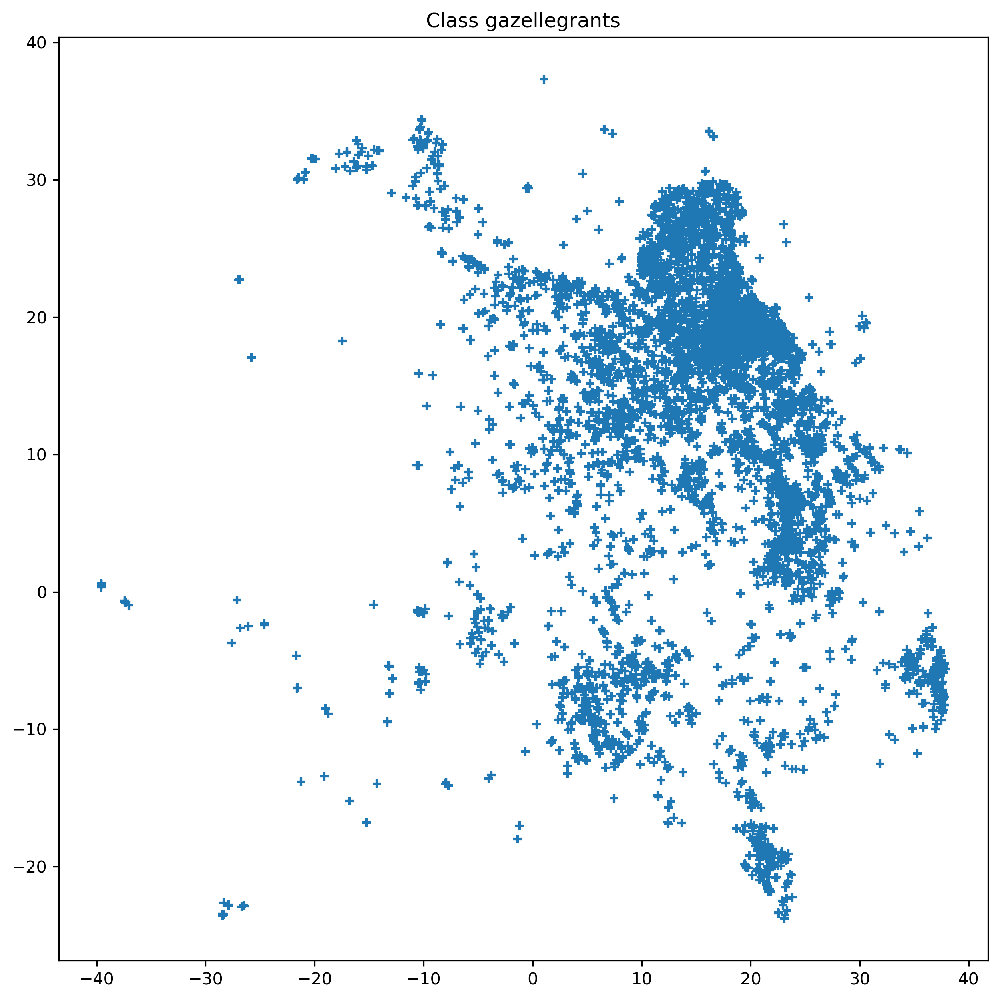

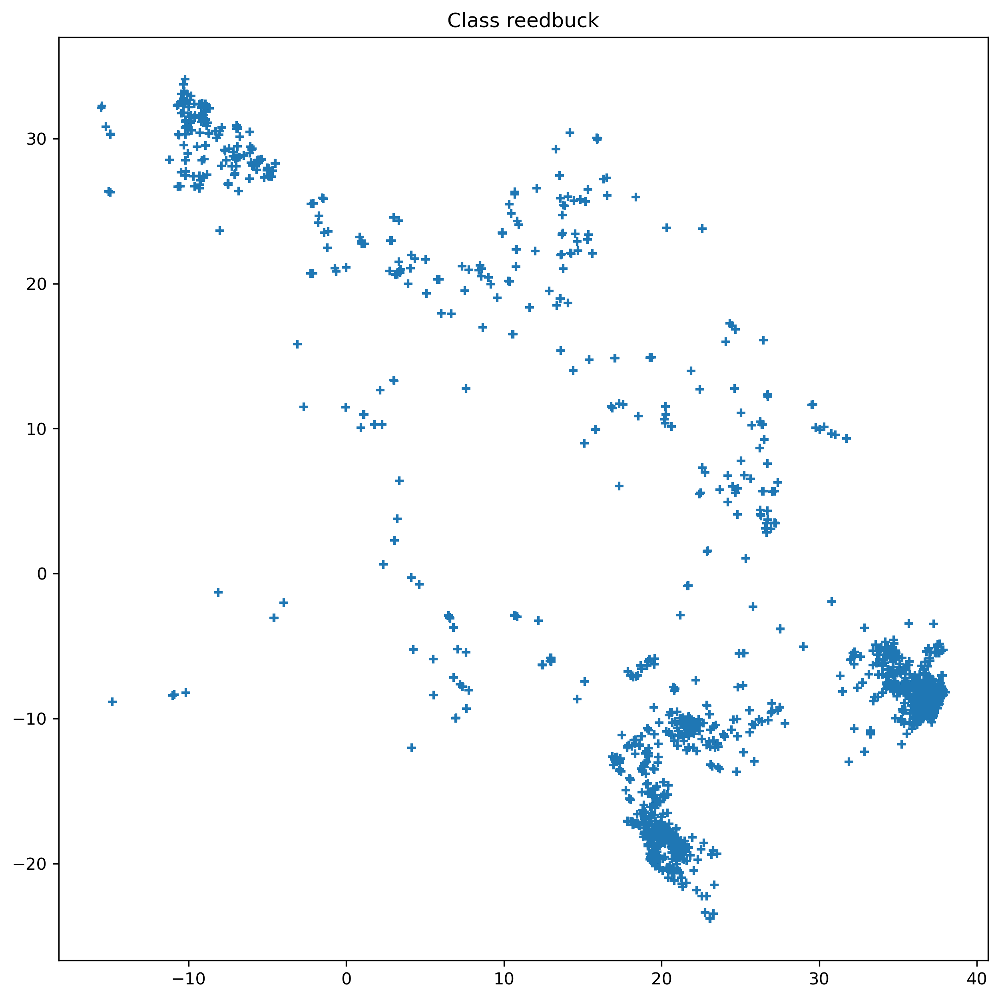

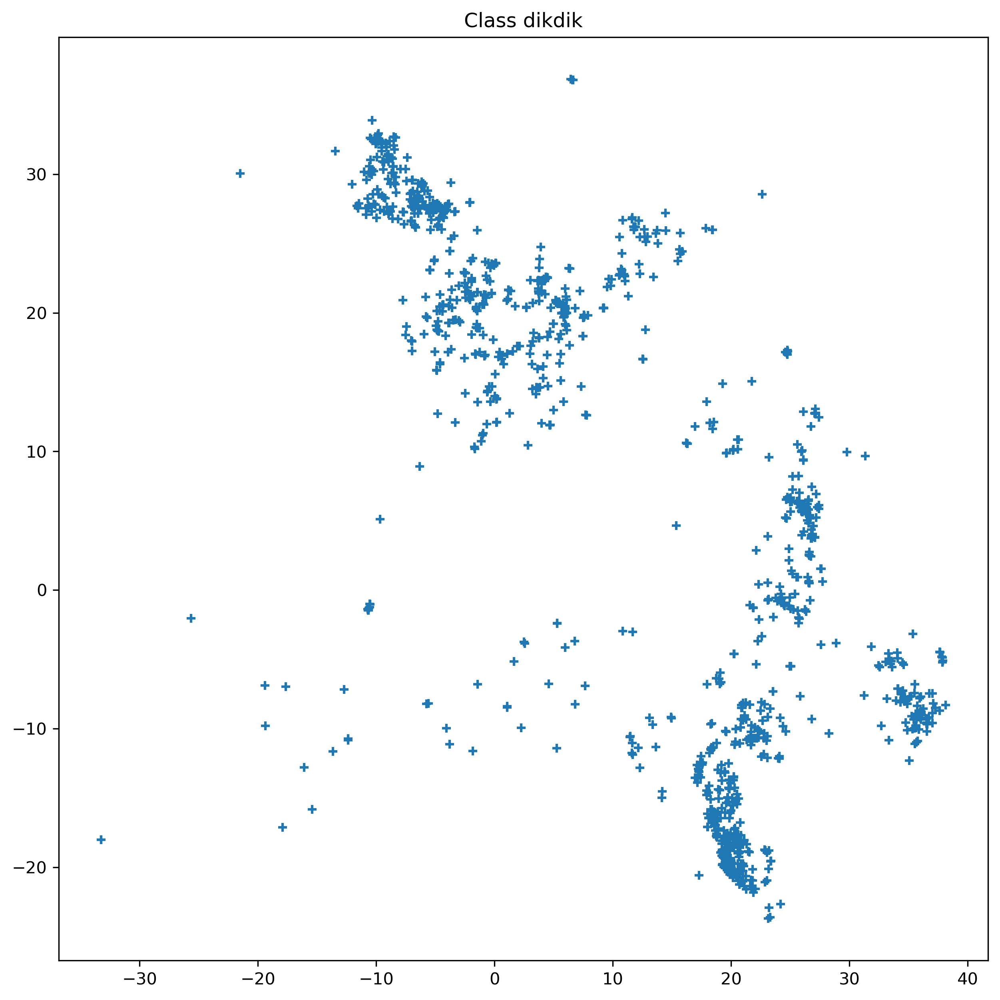

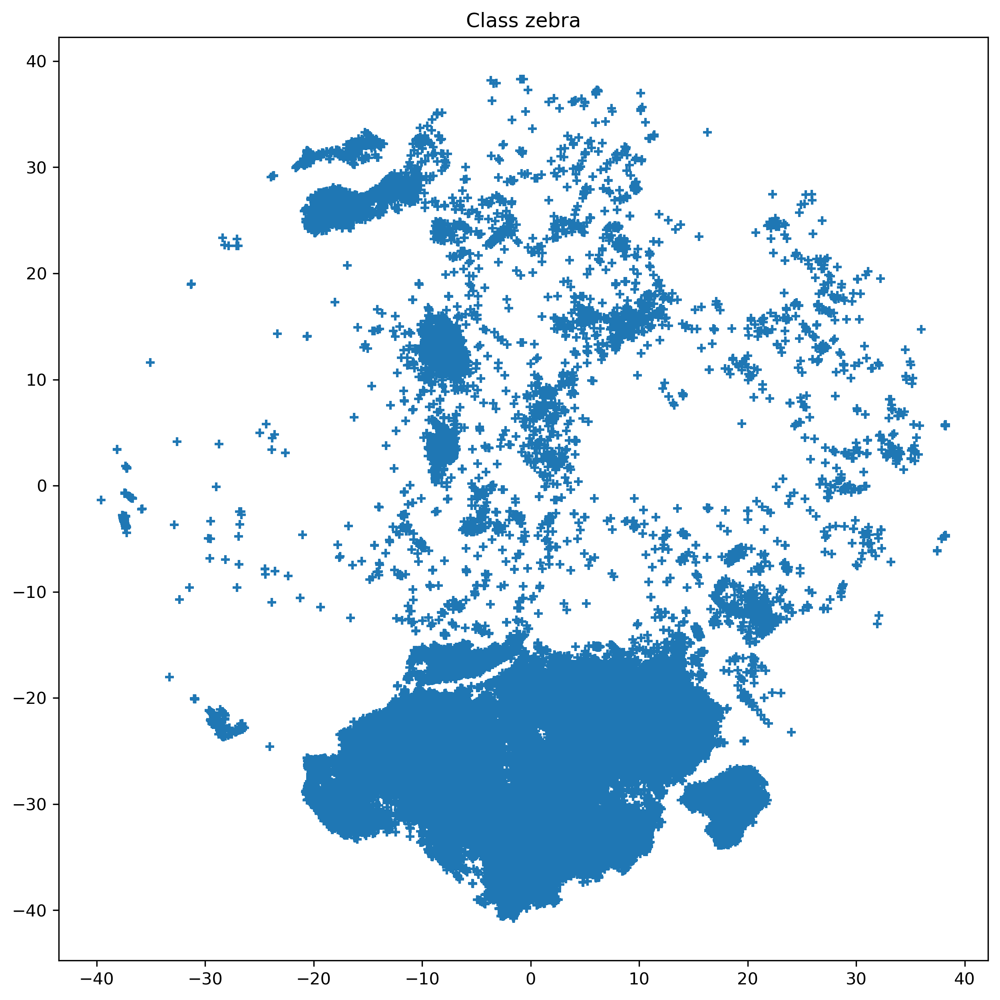

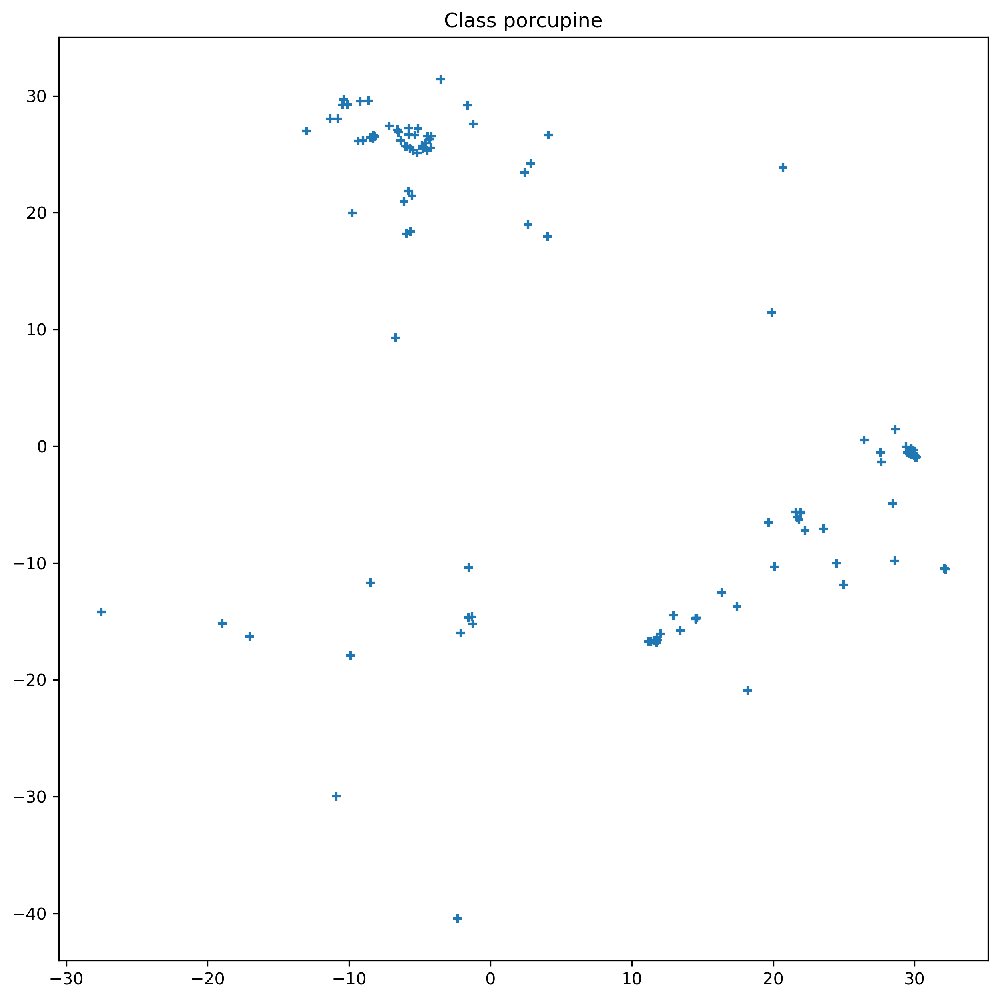

...

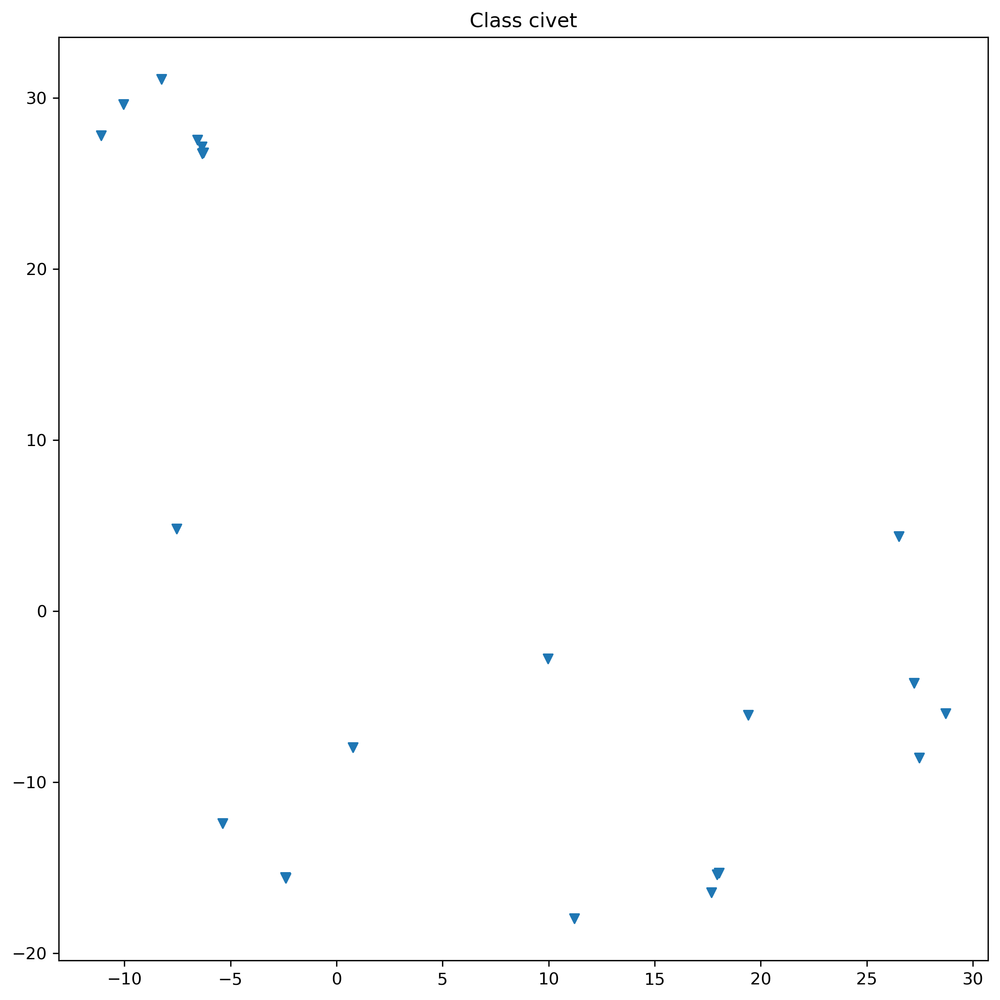

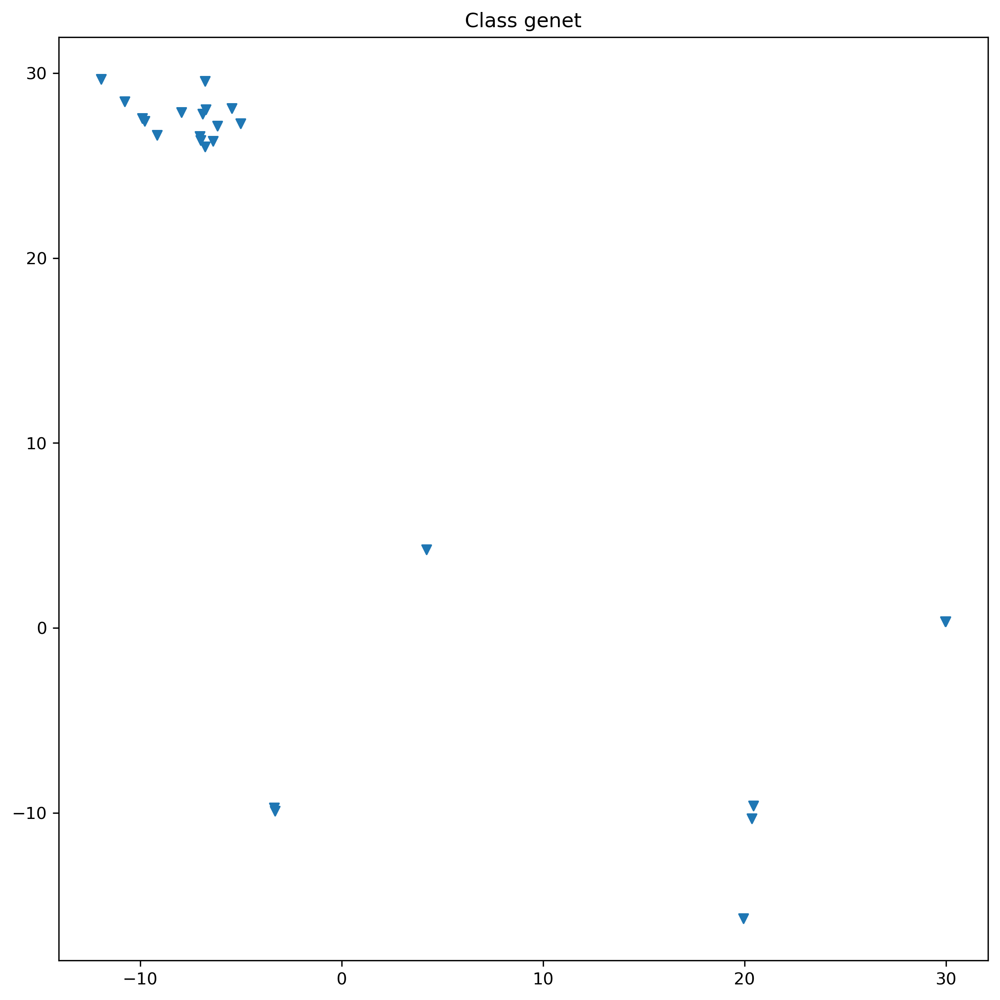

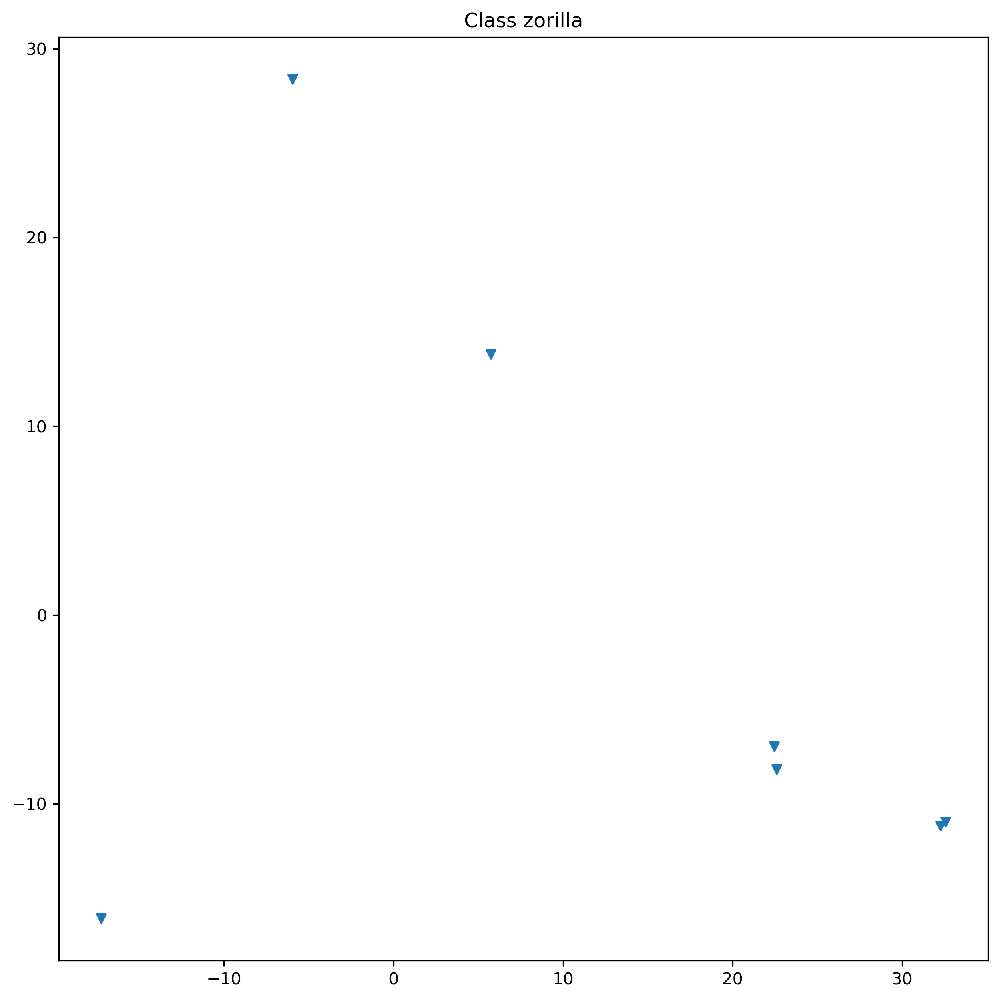

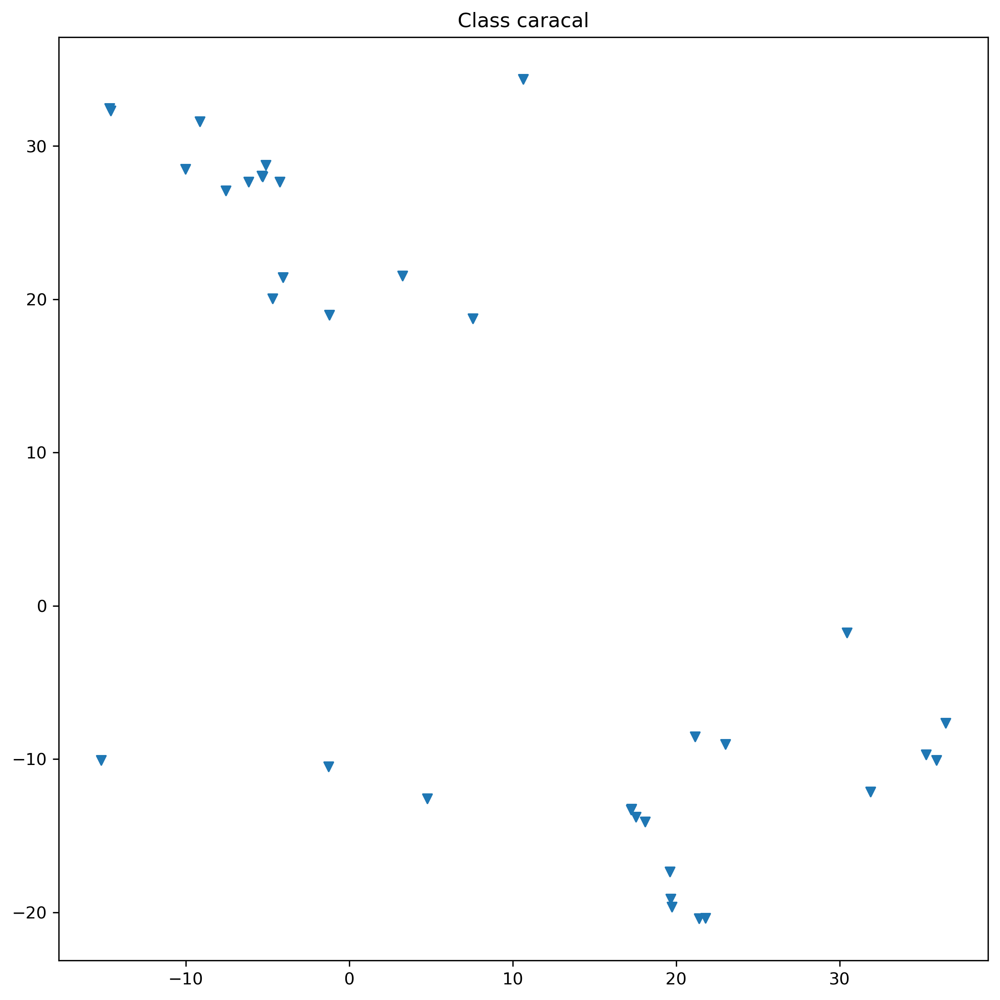

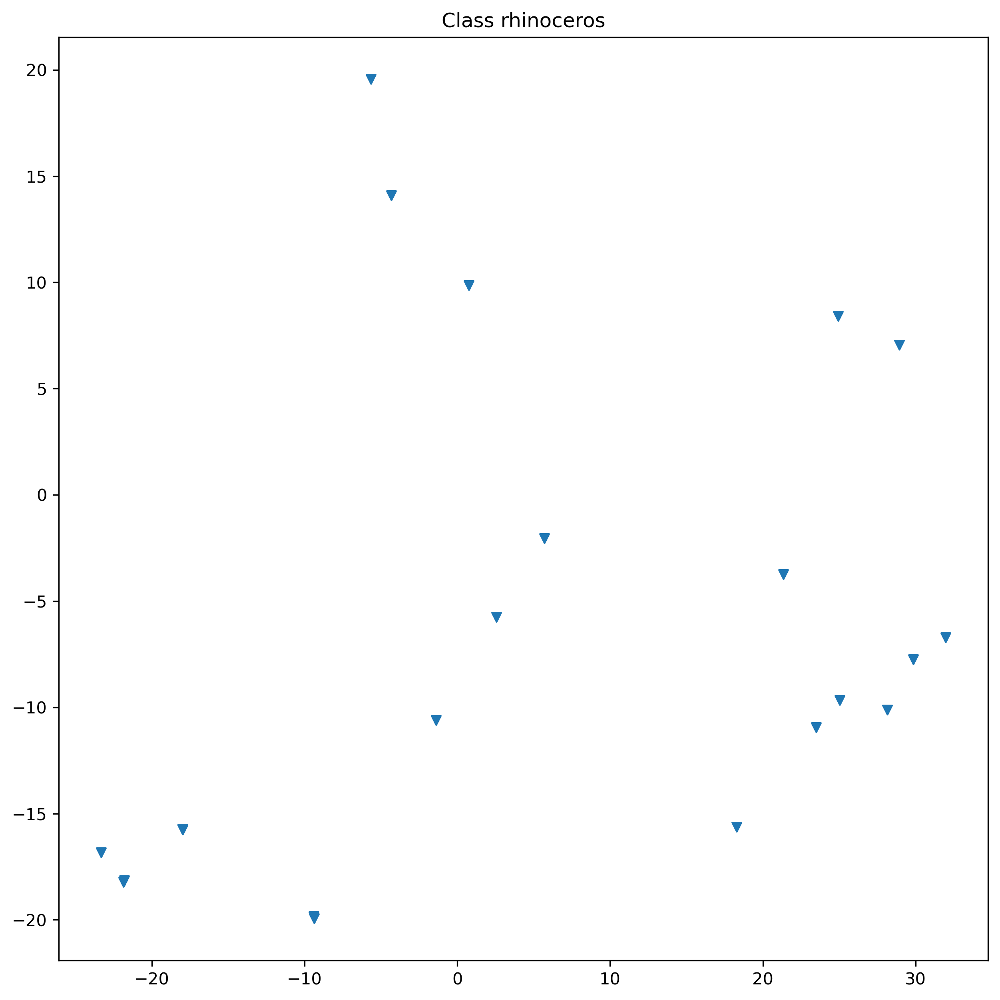

In [157]:
tsne_embeddings

colors = plt.get_cmap('tab20').colors
markers = ['+','x','v']
for i in range(46):
    fig, ax = plt.subplots(figsize=(10, 10),dpi=300)
    positions = np.where(features_label[0]== i)
    # if len(positions[0]) > 50:
    #     positions = positions[0][:50]
    # else:
    #     positions = positions[0]
    tsne_embeddings_i = tsne_embeddings[positions]
    # labeled_indices_i = labeled_indices[0][positions]

    ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])
    ax.set_title(f'Class {lut.name[i]}')
plt.show()

In [ ]:
for i in range()

In [105]:

colors

((0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.74117647

In [74]:
train_df = pd.read_pickle(f'/Volumes/data01/waitsun/snapshotSerengetiCropedResized/df_metadata_train.df')
train_df


,img_name,bbox_pixel_level,category_id,resized_name
0,S1/L07/L07_R1/S1_L07_R1_PICT0103,"[178.91328, 0.0, 1585.9712, 1440.9216000000001]",11,S1/L07/L07_R1/S1_L07_R1_PICT0103_0
1,S1/L07/L07_R1/S1_L07_R1_PICT0234,"[1268.1216, 0.0, 771.8912, 1408.8192]",11,S1/L07/L07_R1/S1_L07_R1_PICT0234_1
2,S1/L07/L07_R1/S1_L07_R1_PICT0072,"[33.32096, 0.0, 2014.6176, 1446.2975999999999]",9,S1/L07/L07_R1/S1_L07_R1_PICT0072_2
3,S1/L07/L07_R1/S1_L07_R1_PICT0020,"[0.3639296, 1133.4144000000001, 131.21536, 300...",16,S1/L07/L07_R1/S1_L07_R1_PICT0020_3
4,S1/L07/L07_R1/S1_L07_R1_PICT0122,"[719.872, 14.737919999999999, 1327.9232, 1253....",11,S1/L07/L07_R1/S1_L07_R1_PICT0122_4
...,...,...,...,...
1094425,S5/K02/K02_R3/S5_K02_R3_IMAG0087,"[1830.912, 69.2736, 216.8832, 1012.0704000000001]",11,S5/K02/K02_R3/S5_K02_R3_IMAG0087_1461185
1094426,S5/K02/K02_R3/S5_K02_R3_IMAG0279,"[11.917312, 89.3184, 648.3968, 1373.184]",3,S5/K02/K02_R3/S5_K02_R3_IMAG0279_1461186
1094427,S5/K02/K02_R3/S5_K02_R3_IMAG0301,"[0.0, 390.60480000000007, 1208.5248, 804.55680...",13,S5/K02/K02_R3/S5_K02_R3_IMAG0301_1461187
1094428,S5/K02/K02_R3/S5_K02_R3_IMAG0146,"[2.7648, 277.8624, 535.1424, 1157.0688]",16,S5/K02/K02_R3/S5_K02_R3_IMAG0146_1461188
